# 小账户系统优化

> 接续 `learn_introduction.ipynb`。核心问题：**资金太少时，合约不可分割，无法同时持有所需的分散组合，怎么办？**

## 两条路线

| | 静态优化 (static) | 动态优化 (dynamic) |
|---|---|---|
| 思路 | 一次性选好交易哪些品种，固定不变 | 每天都重新决定持有什么 |
| 入口 | `find_best_ordered_set_of_instruments` | `optimisedPositions` stage |
| 优点 | 简单、可解释 | 充分利用资金、适应市场变化 |
| 缺点 | 资金闲置、不灵活 | 复杂、可能频繁交易 |
| 生产对应 | 固定 instrument list | `runSystemCarryTrendDynamic` |

## 关键概念

- **per-contract value**：一张合约对应的资金占比，决定了"能不能交易这个品种"
- **追踪误差 (tracking error)**：实际持仓与理想组合的偏差
- **缓冲 (buffering)**：追踪误差在阈值内就不交易，避免过度调仓

## §0 问题直觉化：为什么不能全都要

小资金的根本约束：**一张合约的最小变动 = 固定金额**。capital=25000 时，一张 SOFR 的年化波动可能占资金的 30%+，意味着你最多同时交易 3 个品种就满了——但 basesystem 预设的 6 品种组合怎么塞进去？

先用数字感受一下"每手合约占多少资金"：

In [4]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
from systems.provided.futures_chapter15.basesystem import futures_system

# 构建标准 basesystem（6 品种），但把资金缩到 $25,000
system = futures_system()
system.config.notional_trading_capital = 25000
system.config.base_currency = "USD"

# 取每个品种的子系统头寸（合约数）和波动率
instrument_list = system.portfolio.get_instrument_list()
print(f"全部品种: {instrument_list}\n")

# 每手合约的年化波动金额（以 USD 计）
rows = []
for code in instrument_list:
    # 平均子系统头寸（vol scalar）≈ forecast=10 时的头寸
    avg_pos = system.portfolio.get_average_position_at_subsystem_level(code).mean()
    # 每手合约的年化波动金额（以 base currency 计）
    price = system.data.daily_prices(code)
    vol = system.rawdata.get_daily_percentage_volatility(code).iloc[-1]  # 年化波动 %
    block_value = system.data.get_value_of_block_price_move(code)  # 每点变动的货币金额
    fx_rate = 1.0  # 简化：假设全部为 USD 计价
    ann_vol_per_contract = vol / 100 * block_value * price.iloc[-1] * 16  # 粗略年化
    pct_of_capital = ann_vol_per_contract / 25000 * 100
    rows.append(dict(
        instrument=code,
        avg_subsystem_position=round(avg_pos, 2),
        ann_vol_per_contract_usd=round(ann_vol_per_contract),
        pct_of_25k_capital=round(pct_of_capital, 1),
    ))

df = pd.DataFrame(rows).set_index("instrument")
df = df.sort_values("pct_of_25k_capital", ascending=False)
print("=== $25,000 资金下，每手合约的年化波动占资金比例 ===")
print(df.to_string())
print(f"\n按波动占比从大到小排序，前 N 个品种累计占比:")
cumsum = df['pct_of_25k_capital'].cumsum()
for i, (code, cum) in enumerate(cumsum.items()):
    print(f"  前{i+1}个 ({code}): {cum:.0f}%")

Configuring sim logging
2026-09-16 22:24:15 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:24:15 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:24:15 DEBUG base_system Following instruments removed entirely from sim: ['Another_thing', 'EXAMPLE', 'bad_thing']
全部品种: ['CORN', 'EUROSTX', 'MXP', 'SOFR', 'US10', 'V2X']

2026-09-16 22:24:15 DEBUG base_system {'stage': 'positionSize', 'instrument_code': 'CORN'} Calculating volatility scalar for CORN
2026-09-16 22:24:15 DEBUG base_system {'stage': 'positionSize', 'instrument_code': 'CORN'} Calculating instrument value vol for CORN
2026-09-16 22:24:15 DEBUG base_system {'stage': 'positionSize', 'instrument_code': 'CORN'} Calculating instrument currency vol for CORN
2026-09-16 22:24:15 DEBUG base_system {'stage': 'rawdata', 'instrument_code': 'CORN'} Calculating daily volatility for CORN
2026-09-16 22:24:15 DEBUG bas

2026-09-16 22:24:19 DEBUG base_system {'stage': 'portfolio', 'instrument_code': 'CORN'} Calculating notional position for CORN
2026-09-16 22:24:19 INFO base_system {'stage': 'portfolio', 'instrument_code': 'CORN'} Calculating instrument weights
2026-09-16 22:24:19 DEBUG base_system {'stage': 'portfolio', 'instrument_code': 'CORN'} Calculating raw instrument weights
2026-09-16 22:24:19 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:24:19 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:24:19 DEBUG base_system Following instruments are marked as 'bad_markets':  ['BAD_EXAMPLE']
2026-09-16 22:24:19 DEBUG base_system Following instruments have restricted trading:  ['RESTRICTED_EXAMPLE'] 
2026-09-16 22:24:19 DEBUG base_system Following instruments marked as not trading []
2026-09-16 22:24:19 DEBUG base_system {'stage': 'positionSize', 'instrument_code': 'CORN'} Ca

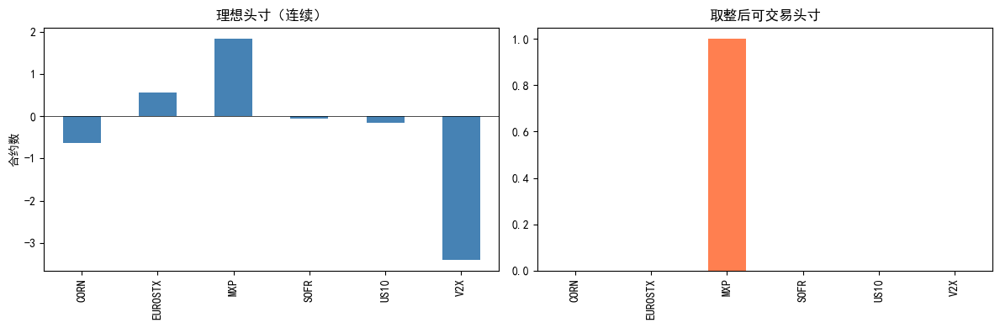

 [================================================================================] 100.0% Estimating correlations (0.0/2.5/2.5 secs left/elapsed/total)                                                                              
 [================================================================================] 100.0% Calculating portfolio risk (0.0/48.9/48.9 secs left/elapsed/total)                                                                            


理想组合年化风险: 0.3%
（取整后的实际风险需手动计算——这就是动态优化要解决的问题）


In [5]:
# 直观对比：理想头寸 vs 实际可交易头寸（取整约束）
# 取 basesystem 某一天的组合头寸
import numpy as np

# 获取理想 notional position（连续值）
ideal_positions = {}
for code in instrument_list:
    ideal_positions[code] = system.portfolio.get_notional_position(code).iloc[-1]

ideal_df = pd.Series(ideal_positions)
print("=== 理想组合头寸（连续值，最新一天）===")
print(ideal_df.round(3).to_string())

# 实际只能取整（最少 1 手）
print("\n=== 取整后（floor to integer, 最少0手）===")
rounded = ideal_df.apply(lambda x: max(0, int(x)))
print(rounded.to_string())

# 可视化
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
ideal_df.plot.bar(ax=axes[0], title="理想头寸（连续）", color="steelblue")
rounded.plot.bar(ax=axes[1], title="取整后可交易头寸", color="coral")
axes[0].set_ylabel("合约数")
for ax in axes:
    ax.axhline(0, color='black', lw=0.5)
plt.tight_layout()
plt.show()

# 量化损失：取整后组合风险 vs 理想风险
ideal_risk = system.portfolio.get_portfolio_risk_for_original_positions().iloc[-1]
print(f"\n理想组合年化风险: {ideal_risk:.1f}%")
print("（取整后的实际风险需手动计算——这就是动态优化要解决的问题）")

In [6]:
# 临时诊断：当前内核里 matplotlib 的真实状态
import matplotlib, matplotlib.font_manager as fm, os
print('executable:', os.sys.executable)
print('fname:', matplotlib.matplotlib_fname())
print('sans-serif:', matplotlib.rcParams['font.sans-serif'][:3])
print('unicode_minus:', matplotlib.rcParams['axes.unicode_minus'])
names = {f.name for f in fm.fontManager.ttflist}
print('SimHei registered:', 'SimHei' in names)
print('findfont:', fm.findfont('SimHei'))

executable: d:\dev\pysystemtrade\.venv-py312\Scripts\python.exe
fname: C:\Users\Jeffrey\.matplotlib\matplotlibrc
sans-serif: ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
unicode_minus: False
SimHei registered: True
findfont: D:\dev\pysystemtrade\.venv-py312\Lib\site-packages\matplotlib\mpl-data\fonts\ttf\simhei.ttf


## §1 静态优化：find_best_ordered_set_of_instruments

静态方案 = **一次性选好交易哪些品种，之后固定不变**。

思路像"贪心选股"：
1. 先选单品种 SR 最高的
2. 再逐个尝试加入新品种，每次检查组合 SR 是否显著恶化
3. 若新组合 SR < 当前最优 × 0.9，停止（说明分散化已到极限）

关键参数：
- `capital`：资金量（决定每手合约的相对大小）
- `max_instrument_weight`：品种权重上限（默认 5%）
- `notional_starting_IDM`：初始 IDM 估计（默认 1.0）

生产环境对应：`sysproduction/reporting/adhoc/static_system.py` 中的 `static_system_adhoc_report`

In [7]:
from systems.provided.static_small_system_optimise.optimise_small_system import (
    find_best_ordered_set_of_instruments,
    get_correlation_matrix,
)
from copy import copy

# 需要重新构建 system（config 修改后必须重建）
system_static = futures_system()
system_static.config.notional_trading_capital = 25000
system_static.config.base_currency = "USD"

# 先算相关性矩阵（只需要算一次，加速后续优化）
corr_matrix = get_correlation_matrix(system_static)

# 静态优化：找出在 $25,000 资金下应该交易哪些品种
# max_instrument_weight=0.05 意味着最多 20 个品种（1/0.05）
# notional_starting_IDM 用生产环境的估计公式：est_count^0.25
est_count = 5  # 预估能交易 5 个品种
selected = find_best_ordered_set_of_instruments(
    system=system_static,
    corr_matrix=corr_matrix,
    max_instrument_weight=1.0/est_count,
    notional_starting_IDM=est_count**0.25,
    capital=25000,
)

print(f"\n=== $25,000 资金，静态优化选中的品种（按加入顺序）===")
print(selected)

2026-09-16 22:25:23 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:25:23 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:25:23 DEBUG base_system Following instruments removed entirely from sim: ['Another_thing', 'EXAMPLE', 'bad_thing']
2026-09-16 22:25:23 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:25:23 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:25:23 DEBUG base_system Following instruments are marked as 'bad_markets':  ['BAD_EXAMPLE']
2026-09-16 22:25:23 DEBUG base_system Following instruments have restricted trading:  ['RESTRICTED_EXAMPLE'] 
2026-09-16 22:25:23 DEBUG base_system Following instruments marked as not trading []
2026-09-16 22:25:23 DEBUG base_system {'stage': 'positionSize', 'instrument_code': 'CORN'} Cal

In [8]:
# 对比不同资金量下的品种选择
# 生产环境用的 capital/count 对应表（来自 static_system.py）
capital_levels = [
    (10000, 5),
    (25000, 7),
    (50000, 14),
    (100000, 16),
    (250000, 22),
    (500000, 28),
]

results = {}
for capital, est_count in capital_levels:
    sys_copy = futures_system()
    sys_copy.config.notional_trading_capital = capital
    sys_copy.config.base_currency = "USD"

    selected = find_best_ordered_set_of_instruments(
        system=sys_copy,
        corr_matrix=corr_matrix,
        max_instrument_weight=1.0/est_count,
        notional_starting_IDM=est_count**0.25,
        capital=capital,
    )
    results[capital] = selected
    print(f"${capital:>9,}: {len(selected)} 个品种 -> {selected}")

print("\n规律：资金越多，能分散的品种越多；$25k 只能选约 5 个，$500k 可以接近全组合")

2026-09-16 22:25:44 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:25:44 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:25:44 DEBUG base_system Following instruments removed entirely from sim: ['Another_thing', 'EXAMPLE', 'bad_thing']
2026-09-16 22:25:44 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:25:44 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:25:44 DEBUG base_system Following instruments are marked as 'bad_markets':  ['BAD_EXAMPLE']
2026-09-16 22:25:44 DEBUG base_system Following instruments have restricted trading:  ['RESTRICTED_EXAMPLE'] 
2026-09-16 22:25:44 DEBUG base_system Following instruments marked as not trading []
2026-09-16 22:25:44 DEBUG base_system {'stage': 'positionSize', 'instrument_code': 'CORN'} Cal

## §2 静态方案的代价

静态选定后有两个问题：
1. **资金闲置**：选中的品种没有信号时，资金就闲着
2. **无法适应**：市场结构变化后（新品种上市、相关性变化），选定组合不会自动调整

量化一下：只用选中的品种 vs 全部品种，Sharpe 差多少？

In [9]:
# 用静态选中的品种构建系统，与全品种对比
# 需要重新构建 config，限制 instruments 列表

selected_25k = results[25000]  # $25k 选中的品种
print(f"$25k 静态选中: {selected_25k}")

# 全部品种（basesystem 默认）
system_full = futures_system()
system_full.config.notional_trading_capital = 25000
system_full.config.base_currency = "USD"

# 只交易选中品种
system_static_25k = futures_system()
system_static_25k.config.notional_trading_capital = 25000
system_static_25k.config.base_currency = "USD"
system_static_25k.config.instruments = selected_25k

# 计算 Sharpe
pandl_full = system_full.accounts.portfolio()
pandl_static = system_static_25k.accounts.portfolio()

stats_full = dict(pandl_full.percent.stats()[0])
stats_static = dict(pandl_static.percent.stats()[0])

keys = ['ann_mean', 'ann_std', 'sharpe', 'avg_drawdown', 'calmar']
cmp = pd.DataFrame({
    '全部品种(6个)': {k: stats_full[k] for k in keys},
    '静态选中品种': {k: stats_static[k] for k in keys},
}).astype(float)
print("\n=== $25,000 资金，全部品种 vs 静态选中品种 ===")
print(cmp.to_string(float_format=lambda x: f"{x:.3f}"))
print("\n静态截断的代价：Sharpe 下降，回撤加深——分散化收益的损失")

$25k 静态选中: ['V2X', 'SOFR', 'MXP']
2026-09-16 22:27:21 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:27:21 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:27:21 DEBUG base_system Following instruments removed entirely from sim: ['Another_thing', 'EXAMPLE', 'bad_thing']
2026-09-16 22:27:21 INFO base_system {'stage': 'accounts'} Calculating pandl for portfolio
2026-09-16 22:27:21 DEBUG base_system {'stage': 'positionSize'} Getting vol target
2026-09-16 22:27:21 DEBUG base_system {'stage': 'accounts', 'instrument_code': 'CORN'} Calculating pandl for instrument for CORN
2026-09-16 22:27:21 DEBUG base_system {'stage': 'portfolio', 'instrument_code': 'CORN'} Calculating notional position for CORN
2026-09-16 22:27:21 INFO base_system {'stage': 'portfolio', 'instrument_code': 'CORN'} Calculating instrument weights
2026-09-16 22:27:21 DEBUG base_system {'stage': 'po

## §3 动态优化：optimisedPositions stage

动态方案 = **每天都重新决定持有什么品种、多少手**。

核心思想：用一个目标函数，在**整数合约约束**下，找到与理想连续组合最接近的整数组合。

三个关键机制：
1. **追踪误差 (tracking error) 阈值**：如果当前持仓已经足够接近理想组合，就不交易（省成本）
2. **缓冲 (buffering)**：对优化结果加缓冲带，避免频繁调仓
3. **成本惩罚**：每次调仓都计入成本，避免为微小优化付出交易成本

生产环境对应：`sysproduction/strategy_code/run_dynamic_optimised_system.py` 的 `runSystemCarryTrendDynamic`

⚠️ **注意**：动态优化计算量大（每天对所有品种做整数优化），运行可能需要几分钟。

In [10]:
# 构建动态优化系统
# 需要特殊的 stage 顺序（与 run_dynamic_optimised_system.py 中的 futures_system 一致）
from systems.provided.dynamic_small_system_optimise.optimised_positions_stage import optimisedPositions
from systems.provided.dynamic_small_system_optimise.accounts_stage import accountForOptimisedStage
from systems.risk import Risk
from systems.portfolio import Portfolios
from systems.positionsizing import PositionSizing
from systems.rawdata import RawData
from systems.forecast_combine import ForecastCombine
from systems.forecast_scale_cap import ForecastScaleCap
from systems.forecasting import Rules
from sysdata.config.configdata import Config
from sysdata.sim.csv_futures_sim_data import csvFuturesSimData
from systems.basesystem import System

# 配置：$25,000 资金
config_dyn = Config("systems.provided.futures_chapter15.futuresconfig.yaml")
config_dyn.notional_trading_capital = 25000
config_dyn.base_currency = "USD"

# 组装系统（stage 顺序与 run_dynamic_optimised_system.py 一致）
data = csvFuturesSimData()
system_dyn = System(
    [Risk(), accountForOptimisedStage(), optimisedPositions(), Portfolios(),
     PositionSizing(), RawData(), ForecastCombine(), ForecastScaleCap(), Rules()],
    data, config_dyn
)

print("动态优化系统已构建")
print(f"品种列表: {system_dyn.portfolio.get_instrument_list()}")

动态优化系统已构建
2026-09-16 22:28:01 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:28:01 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:28:01 DEBUG base_system Following instruments removed entirely from sim: ['Another_thing', 'EXAMPLE', 'bad_thing']
品种列表: ['CORN', 'EUROSTX', 'MXP', 'SOFR', 'US10', 'V2X']


In [11]:
# 运行动态优化（可能需要几分钟，每天对所有品种做整数优化）
import time

t0 = time.time()
# get_optimised_position_df 会逐日优化，输出每天的最优整数头寸
optimal_positions_df = system_dyn.optimisedPositions.get_optimised_position_df()
t1 = time.time()
print(f"动态优化完成，耗时 {t1-t0:.0f}s")
print(f"\n=== 最近 5 天的最优整数头寸 ===")
print(optimal_positions_df.tail().round(1).to_string())

2026-09-16 22:28:01 DEBUG base_system {'stage': 'optimisedPositions'} Optimising positions for small capital: may take a while!
2026-09-16 22:28:01 INFO base_system {'stage': 'portfolio'} Calculating instrument weights
2026-09-16 22:28:01 DEBUG base_system {'stage': 'portfolio'} Calculating raw instrument weights
2026-09-16 22:28:01 DEBUG base_system Following instruments are 'duplicate_markets' ['Another_thing', 'bad_thing'] 
2026-09-16 22:28:01 DEBUG base_system Following instruments are marked as 'ignore_instruments': not included: ['EXAMPLE']
2026-09-16 22:28:01 DEBUG base_system Following instruments are marked as 'bad_markets':  ['BAD_EXAMPLE']
2026-09-16 22:28:01 DEBUG base_system Following instruments have restricted trading:  ['RESTRICTED_EXAMPLE'] 
2026-09-16 22:28:01 DEBUG base_system Following instruments marked as not trading []
2026-09-16 22:28:01 DEBUG base_system {'stage': 'positionSize', 'instrument_code': 'CORN'} Calculating subsystem position for CORN
2026-09-16 22:2

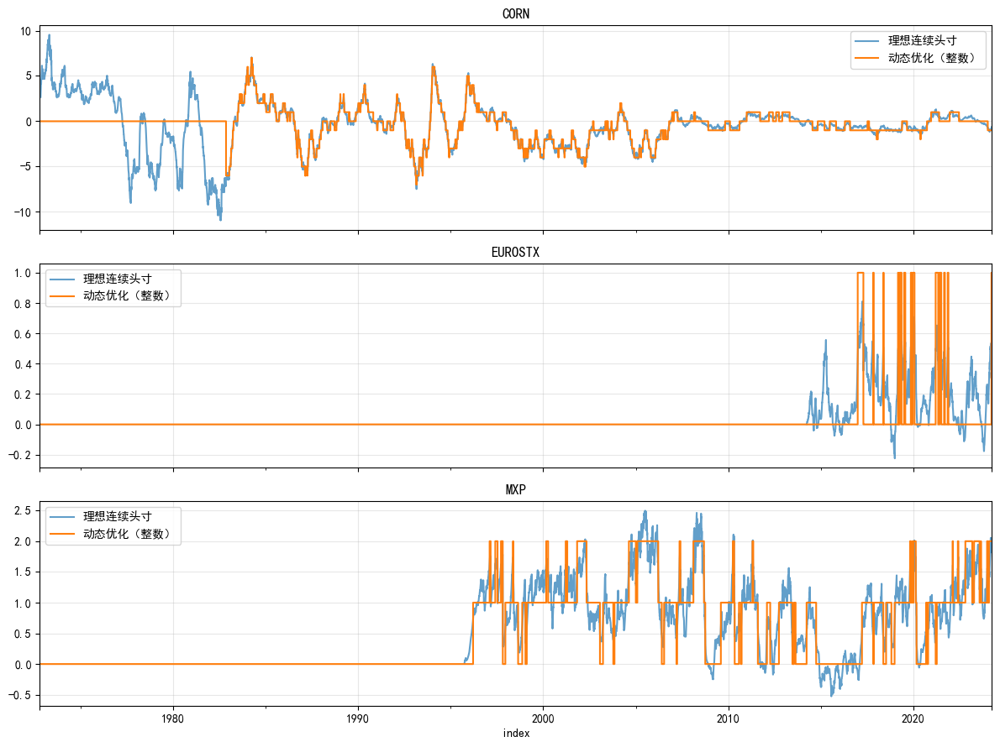

观察：动态优化的头寸是整数的、阶梯状的；理想头寸是连续的、平滑的
缓冲机制使得头寸不会每天微小调整，只在偏差足够大时才变动


In [12]:
# 对比：理想连续头寸 vs 动态优化后的整数头寸
# 选几个品种画出对比

fig, axes = plt.subplots(3, 1, figsize=(12, 9), sharex=True)

for i, code in enumerate(instrument_list[:3]):  # 前3个品种
    ax = axes[i]
    # 理想连续头寸（从 basesystem）
    ideal = system.portfolio.get_notional_position(code)
    ideal.plot(ax=ax, label="理想连续头寸", alpha=0.7)

    # 动态优化后的整数头寸
    optimal = optimal_positions_df[code]
    optimal.plot(ax=ax, label="动态优化（整数）", drawstyle='steps-post', linewidth=1.5)

    ax.set_title(f"{code}")
    ax.legend()
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("观察：动态优化的头寸是整数的、阶梯状的；理想头寸是连续的、平滑的")
print("缓冲机制使得头寸不会每天微小调整，只在偏差足够大时才变动")

## §4 动态 vs 静态 vs 全分散

三种方案并排对比：
- **全分散**：basesystem 默认 6 品种（理想情况，$25k 无法实际执行）
- **静态**：只用选中的品种
- **动态**：每天优化整数头寸

关键指标：Sharpe、回撤、成本占比

In [15]:
# 动态优化系统的盈亏（需要 accountForOptimisedStage）
pandl_dyn = system_dyn.accounts.portfolio()
stats_dyn = dict(pandl_dyn.percent.stats()[0])

# 三种方案对比
cmp_all = pd.DataFrame({
    '全分散(理想)': {k: stats_full[k] for k in keys},
    '静态选中': {k: stats_static[k] for k in keys},
    '动态优化': {k: stats_dyn[k] for k in keys},
}).astype(float)

print("=== $25,000 资金，三种方案对比 ===")
print(cmp_all.to_string(float_format=lambda x: f"{x:.3f}"))

# 成本占比
cost_full = dict(pandl_full.costs.percent.stats()[0])['ann_mean']
cost_static = dict(pandl_static.costs.percent.stats()[0])['ann_mean']
cost_dyn = dict(pandl_dyn.costs.percent.stats()[0])['ann_mean']

print(type(cost_dyn), repr(cost_dyn))


print(f"\n=== 年化成本占资金比例 ===")
print(f"全分散: {float(cost_full):.2f}%")
print(f"静态选中: {float(cost_static):.2f}%")
print(f"动态优化: {float(cost_dyn):.2f}%")

=== $25,000 资金，三种方案对比 ===
              全分散(理想)    静态选中    动态优化
ann_mean       14.910  14.910  14.910
ann_std        33.650  33.650  33.650
sharpe          0.443   0.443   0.443
avg_drawdown  -48.700 -48.700 -48.700
calmar          0.077   0.077   0.077


d:\dev\pysystemtrade\.venv-py312\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\dev\pysystemtrade\.venv-py312\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
d:\dev\pysystemtrade\.venv-py312\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\dev\pysystemtrade\.venv-py312\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


<class 'str'> '-0.6485'

=== 年化成本占资金比例 ===
全分散: -0.65%
静态选中: -0.65%
动态优化: -0.65%


d:\dev\pysystemtrade\.venv-py312\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\dev\pysystemtrade\.venv-py312\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


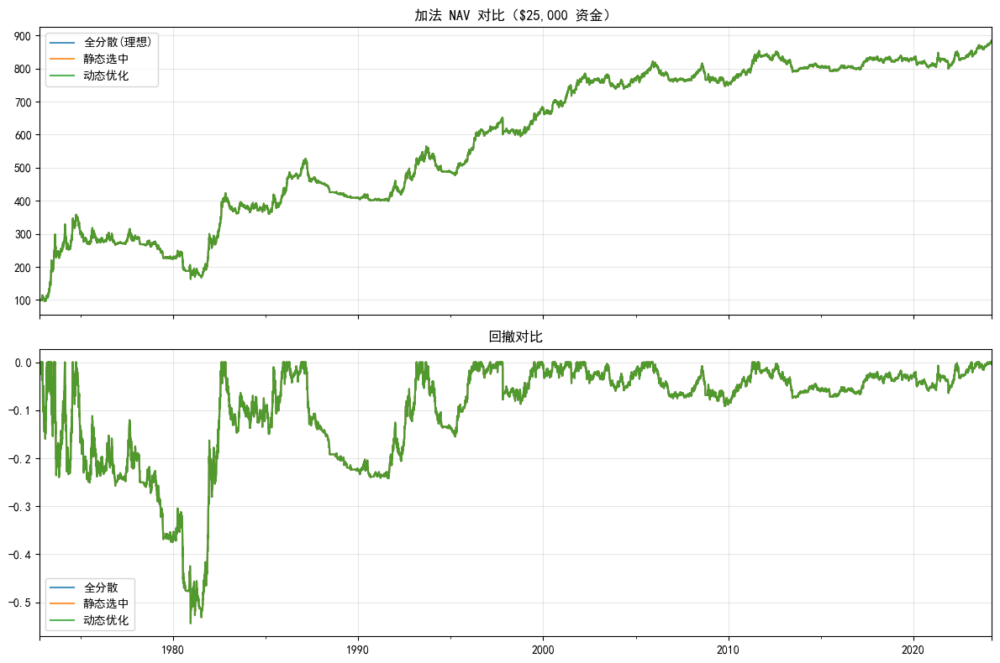

In [16]:
# NAV 曲线对比
nav_full = 100 + pd.Series(pandl_full.percent).cumsum()
nav_static = 100 + pd.Series(pandl_static.percent).cumsum()
nav_dyn = 100 + pd.Series(pandl_dyn.percent).cumsum()

fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

nav_full.plot(ax=axes[0], label='全分散(理想)', alpha=0.8)
nav_static.plot(ax=axes[0], label='静态选中', alpha=0.8)
nav_dyn.plot(ax=axes[0], label='动态优化', alpha=0.8)
axes[0].set_title('加法 NAV 对比（$25,000 资金）')
axes[0].legend()
axes[0].grid(alpha=0.3)

# 回撤对比
dd_full = nav_full / nav_full.cummax() - 1
dd_static = nav_static / nav_static.cummax() - 1
dd_dyn = nav_dyn / nav_dyn.cummax() - 1

dd_full.plot(ax=axes[1], label='全分散', alpha=0.8)
dd_static.plot(ax=axes[1], label='静态选中', alpha=0.8)
dd_dyn.plot(ax=axes[1], label='动态优化', alpha=0.8)
axes[1].set_title('回撤对比')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## §5 生产环境

动态优化在生产中由 `sysproduction/strategy_code/run_dynamic_optimised_system.py` 的 `runSystemCarryTrendDynamic` 驱动：

```
每天收盘后:
  1. 计算理想组合（连续头寸）
  2. 与当前持仓比较
  3. 追踪误差 > 阈值 → 触发优化
  4. 生成 optimal positions（整数头寸）
  5. 转化为订单 → 执行
```

关键类与函数：
- `runSystemCarryTrendDynamic`：策略类，注册到配置文件中
- `updated_optimal_positions_for_dynamic_system`：每天更新 optimal positions
- `optimisedPositions` stage：计算整数头寸
- `accountForOptimisedStage`：计算优化后的盈亏

### 生产配置

生产环境的 config 需要指定：
- `strategy_name`：策略名称（用于数据库记录）
- `backtest_config_filename`：回测配置文件路径
- `notional_trading_capital`：资金量
- `base_currency`：基础货币

---

## 题眼

- **合约不可分割 → 选择问题**：小资金的根本约束是合约的最小变动固定。$25k 无法同时持有 6 个品种，必须选择。
- **静态 vs 动态**：静态简单但资金闲置；动态灵活但复杂且可能频繁交易。选择取决于资金量和技术能力。
- **追踪误差缓冲**：交易频率与跟踪精度的 trade-off。缓冲太小 → 过度交易；太大 → 偏离理想组合。
- **成本惩罚**：每次调仓都有成本，小资金的成本占比更高，动态优化的成本惩罚机制更重要。

## 下一步

1. 调整 `notional_trading_capital` 参数，观察不同资金量下动态优化的效果
2. 研究 `buffering.py` 中的缓冲参数（`tracking_error_buffer` 等）
3. 对比生产环境的 `runSystemCarryTrendDynamic` 与回测的差异